In [2]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import random
import math 

In [3]:
from google.colab.patches import cv2_imshow

In [4]:
# import sys
# import numpy
# numpy.set_printoptions(threshold=sys.maxsize)

In [5]:
def loadVid(path):
	# Create a VideoCapture object and read from input file
	# If the input is the camera, pass 0 instead of the video file name
	cap = cv2.VideoCapture(path)
	 
	# Check if camera opened successfully
	if (cap.isOpened()== False): 
		print("Error opening video stream or file")

	i = 0
	# Read until video is completed
	while(cap.isOpened()):
		# Capture frame-by-frame
		i += 1
		ret, frame = cap.read()
		if ret == True:

			#Store the resulting frame
			if i == 1:
				frames = frame[np.newaxis, ...]
			else:
				frame = frame[np.newaxis, ...]
				frames = np.vstack([frames, frame])
				frames = np.squeeze(frames)
			
		else: 
			break
	 
	# When everything done, release the video capture object
	cap.release()

	return frames

 # 1.1 Getting Correspondences 

In [6]:
frames = loadVid("/content/book.mov")

In [7]:
first_frame = np.copy(frames[0])
img = cv2.imread('cv_cover.jpg')

In [8]:
def sift_descriptor(img):  
  gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  
  # Applying SIFT detector
  sift = cv2.SIFT_create()
  # find the keypoints and descriptors with SIFT
  kp, des = sift.detectAndCompute(img,None)
  
  return kp,des

def BF_FeatureMatcher(des1,des2,ratio):
    brute_force = cv2.BFMatcher()
    matches = brute_force.knnMatch(des1,des2,k=2)

    # Apply ratio test
    good = []
    for m,n in matches:
      # print(m.trainIdx,m.queryIdx)
      # print(n.trainIdx,n.queryIdx)
      if m.distance < ratio*n.distance:
          good.append([m])
    return good

def drawMatches(img1,kp1,img2,kp2,good):
  img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  cv2_imshow(img3)

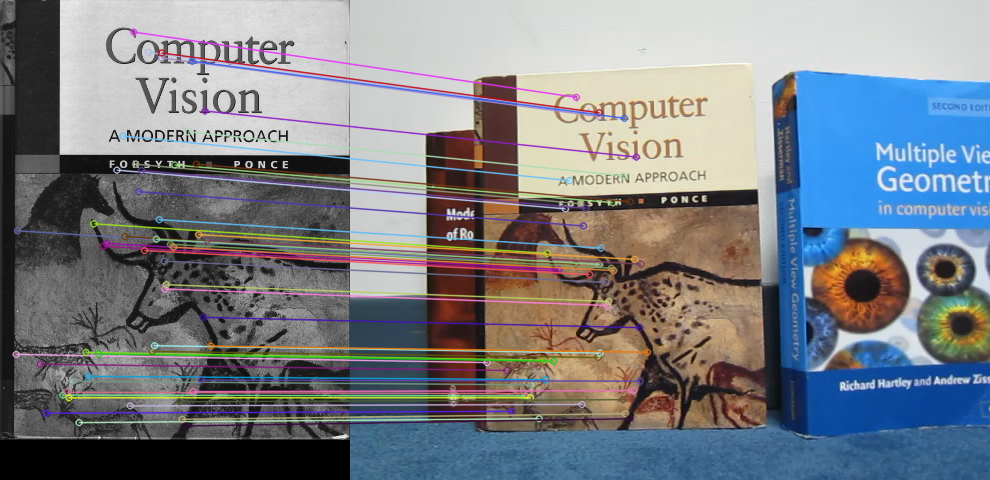

In [9]:
frame_kp, frame_descriptor = sift_descriptor(first_frame)
img_kp, img_descriptor = sift_descriptor(img)

matches = BF_FeatureMatcher(img_descriptor,frame_descriptor,0.7)
drawMatches(img,img_kp,first_frame,frame_kp,matches[0:250:5])

# 1.2 Compute the Homography Parameters

In [10]:
def compute_homography(img_kp,frame_kp,correspondances):
  inliers = 0
  for i in range(100):
    r = random.sample(correspondances, 4)
    H = ransac_homography(img_kp,frame_kp,r)
    n = count_inliers(img_kp,frame_kp,np.copy(correspondances),H)
    if n > inliers:
      best_H = np.copy(H)
      inliers = n
    # print(inliers)
  return best_H

def ransac_homography(img_kp,frame_kp,correspondances):
  A = []
  n = len(correspondances)
  correspondances = np.array(correspondances).reshape(-1)
  query_pts = np.float32([img_kp[m.queryIdx].pt for m in correspondances]).reshape(-1, 1, 2)
  train_pts = np.float32([frame_kp[m.trainIdx].pt for m in correspondances]).reshape(-1, 1, 2)
  x,y = query_pts[:,0,0],query_pts[:,0,1]
  x_dash,y_dash = train_pts[:,0,0],train_pts[:,0,1]
  for i in range(n):
    # x , y = frame_kp[i[0].trainIdx].pt
    # x_dash, y_dash = img_kp[i[0].queryIdx].pt
    A_i = [[-x[i], -y[i], -1, 0, 0, 0, x[i]*x_dash[i], y[i]*x_dash[i], x_dash[i]], 
           [0, 0, 0, -x[i], -y[i], -1, x[i]*y_dash[i], y[i]*y_dash[i], y_dash[i]]]
    A.append(A_i)
  A = np.array(A)
  A = A.reshape((2*n,9))
  H = compute_H(A)
  return H

def compute_H(A):
  u, s, vh = np.linalg.svd(A)
  H = vh[-1,:]/vh[-1,-1]
  H = H.reshape((3,3))
  return H

def count_inliers(img_kp,frame_kp,correspondances,H):
  correspondances = np.array(correspondances).reshape(-1)
  query_pts = np.float32([img_kp[m.queryIdx].pt for m in correspondances]).reshape(-1, 1, 2)
  train_pts = np.float32([frame_kp[m.trainIdx].pt for m in correspondances]).reshape(-1, 1, 2)
  threshold = 0.75
  inliers = 0
  for i in range(len(query_pts)):
    p = np.array([[query_pts[i,0,0]],[query_pts[i,0,1]],[1]])
    p_dash = np.dot(H,p)
    p_dash = (p_dash/p_dash[2])
    # print(p_dash[0],p_dash[1],train_pts[i,0,0],train_pts[i,0,1])
    # print(abs(p_dash[0]-train_pts[i,0,0]),abs(p_dash[1]-train_pts[i,0,1]))
    if (abs(p_dash[0]-train_pts[i,0,0]) <= threshold) and (abs(p_dash[1]-train_pts[i,0,1]) <= threshold):
      inliers+=1
  return inliers

In [11]:
H = compute_homography(img_kp,frame_kp,matches)

# 1.3 Calculate Book Coordinates

In [12]:
def points_projection(pts,H):
  projection = []
  for i in range(pts.shape[1]):
    for j in range(pts.shape[0]):
      p = np.array([[i],[j],[1]])
      p_dash = np.dot(H,p)
      p_dash = (p_dash/p_dash[2])
      projection.append(p_dash[0:2].reshape((2,)))
  return np.array(projection)

def intensity_projection(img,frame,p_dash):
  f = np.copy(frame)
  counter = 0
  for i in range(img.shape[1]):
    for j in range(img.shape[0]):
      x = img[j][i]
      n = int(p_dash[counter][0])
      m = int(p_dash[counter][1])
      counter+=1
      if m < 0 or n < 0 or m >= f.shape[0] or n >= f.shape[1]:
        continue
      f[m,n] = x
  return f

def detect_corners(image,H):
  h, w = image.shape[0],image.shape[1]
  pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
  corners = []
  for i in range(4):
    p = np.array([[pts[i][0][0]],[pts[i][0][1]],[1]])
    p_dash = np.dot(H,p)
    p_dash = (p_dash/p_dash[2]).astype(int)
    corners.append(p_dash[0:2].reshape((2,)))
  return corners

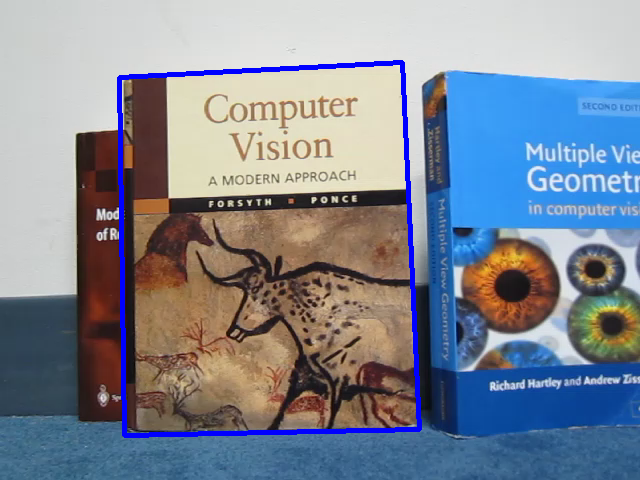

In [13]:
corners = detect_corners(img,H)
homography = cv2.polylines(np.copy(first_frame), [np.int32(corners)], True, (255, 0, 0), 3)
cv2_imshow(homography)
 
# h, w = 440, 350
# pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
# corners = cv2.perspectiveTransform(pts, H)
# homography = cv2.polylines(first_frame, [np.int32(corners)], True, (255, 0, 0), 3)
# cv2_imshow(homography)

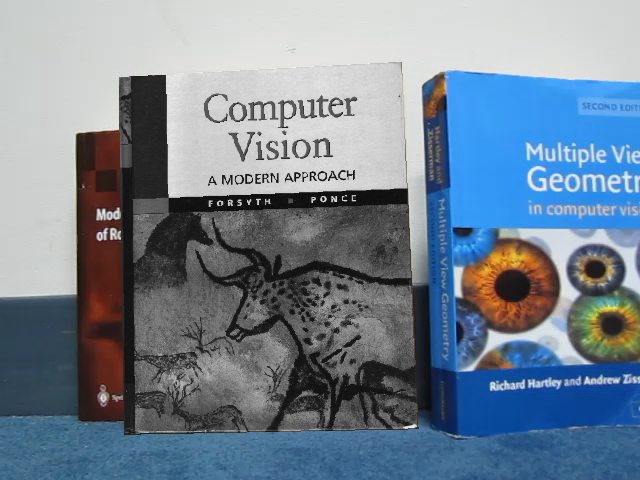

In [14]:
p_dash = points_projection(img, H)
new_frame = intensity_projection(img,first_frame,p_dash)
cv2_imshow(new_frame)

# 1.4 Crop AR Video Frames

In [15]:
img.shape

(440, 350, 3)

In [16]:
def crop_frame(corners,frame):
  height = img.shape[0]
  width = img.shape[1]
  aspect_ratio = width/height
  cropped_width = int(frame.shape[0]*aspect_ratio)
  x =  int(0.5*frame.shape[1]-0.5*cropped_width)
  cropped_frame = frame[45:-45, x:x+cropped_width]
  stretch_frame = cv2.resize(cropped_frame, (img.shape[1], img.shape[0]), interpolation = cv2.INTER_LINEAR)
  return stretch_frame

In [17]:
ar_frames = loadVid("/content/ar_source.mov")

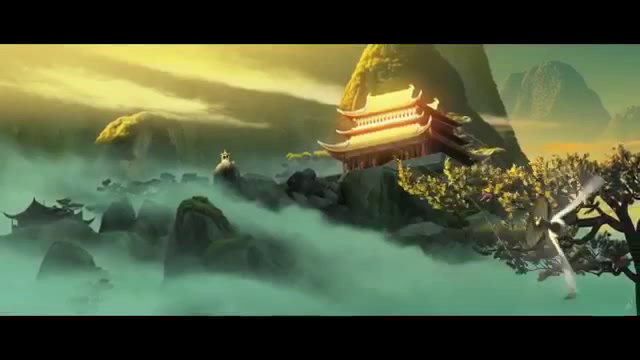

In [18]:
first_ar_frame = np.copy(ar_frames[0])
cv2_imshow(first_ar_frame)

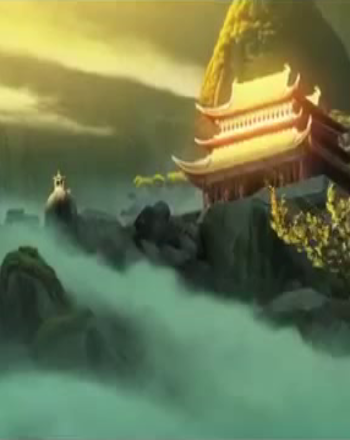

(440, 350, 3)

In [19]:
corners = detect_corners(img,H)
cropped_ar_frame = crop_frame(corners,first_ar_frame)
cv2_imshow(cropped_ar_frame)
cropped_ar_frame.shape

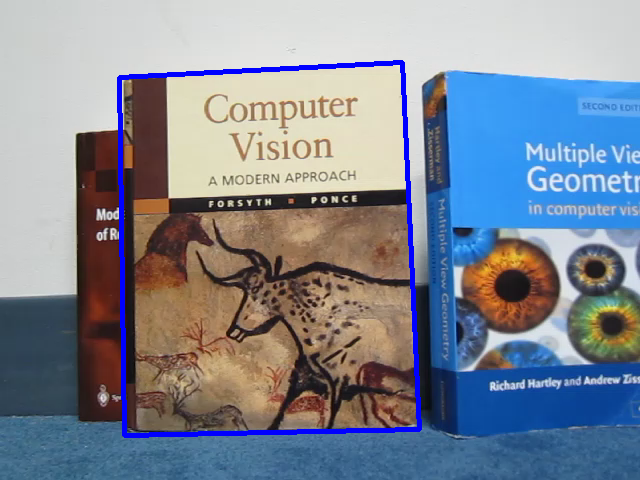

[array([119,  77]), array([124, 435]), array([419, 429]), array([402,  62])]

In [20]:
corners = detect_corners(cropped_ar_frame,H)
homography = cv2.polylines(np.copy(first_frame), [np.int32(corners)], True, (255, 0, 0), 3)
cv2_imshow(homography)
corners

# 1.5 Overlay the First Frame of the Two Videos

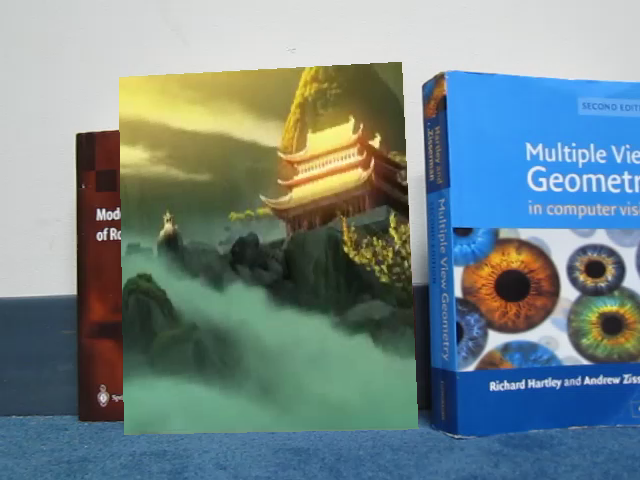

In [21]:
p_dash = points_projection(cropped_ar_frame, H)
new_frame = intensity_projection(cropped_ar_frame,first_frame,p_dash)
cv2_imshow(new_frame)

# 1.6 Creating AR Application

In [ ]:
new_video_frames = []
img_kp, img_descriptor = sift_descriptor(img)
for i in range(len(ar_frames)):
  print(i)
  frame_kp, frame_descriptor = sift_descriptor(frames[i])
  matches = BF_FeatureMatcher(img_descriptor,frame_descriptor,0.5)

  H = compute_homography(img_kp,frame_kp,matches)

  corners = detect_corners(img,H)
  cropped_ar_frame = crop_frame(corners,ar_frames[i])
  homography = cv2.polylines(np.copy(frames[i]), [np.int32(corners)], True, (255, 0, 0), 3)
  # cv2_imshow(homography)

  p_dash = points_projection(cropped_ar_frame, H)
  new_frame = intensity_projection(cropped_ar_frame,frames[i],p_dash)
  # cv2_imshow(new_frame)
  new_video_frames.append(new_frame)


In [23]:
out = cv2.VideoWriter('project11.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, (frames.shape[0],frames.shape[1]))
for i in range(len(new_video_frames)):
    out.write(new_video_frames[i])
out.release()

# Part Two

# 2.1 Getting Correspondences and Compute the Homography Parameters

In [89]:
def bilinear_interpolation(img,p):
  intensity = [] 
  for i in range(3):
    x = np.array([(math.ceil(p[1])-p[1]),p[1]-math.floor(p[1])])
    x = x.reshape(1,2)

    y = np.array([(math.ceil(p[0])-p[0]),p[0]-math.floor(p[0])])
    y = y.reshape(2,1)

    # if p[0] < 0 or p[1] < 0 or p[0] >= img.shape[1] or p[1] >= img.shape[0]:
    #     return [0,0,0]

    try:
      f00 = img[math.floor(p[1]),math.floor(p[0]),i]
      f01 = img[math.floor(p[1]),math.ceil(p[0]),i]
      f10 = img[math.ceil(p[1]),math.floor(p[0]),i]
      f11 = img[math.ceil(p[1]),math.ceil(p[0]),i]
    except:
      return [0,0,0]

    m = [[f00,f01],[f10,f11]]

    m = (np.array(m)).reshape(2,2)
    intensity.append(np.dot(np.dot(x,m),y)) 
  return intensity  

In [90]:
img2 = cv2.imread('/content/image1.jpg')
img1 = cv2.imread('/content/image2.jpg')

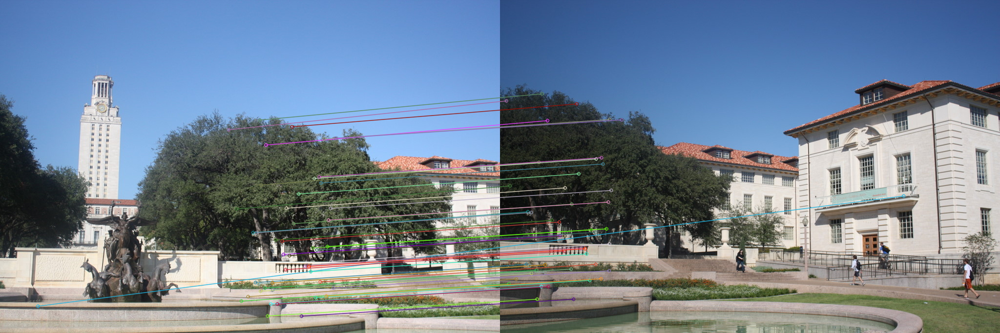

In [91]:
img1_kp, img1_descriptor = sift_descriptor(img1)
img2_kp, img2_descriptor = sift_descriptor(img2)

matches = BF_FeatureMatcher(img1_descriptor,img2_descriptor,0.7)
drawMatches(img1,img1_kp,img2,img2_kp,matches[0:250:5])
H = compute_homography(img1_kp,img2_kp,matches)

In [92]:
height = img1.shape[0]
width =1575
channels = 3
blank_frame = np.zeros((height,width,channels), dtype=np.uint8)
blank_frame = np.array(blank_frame)

blank_frame_cpy = np.copy(blank_frame)

for i in range(img1.shape[0]):
  for j in range(img1.shape[1]):
    blank_frame[i][j] = img1[i,j]
blank_frame = np.array(blank_frame)

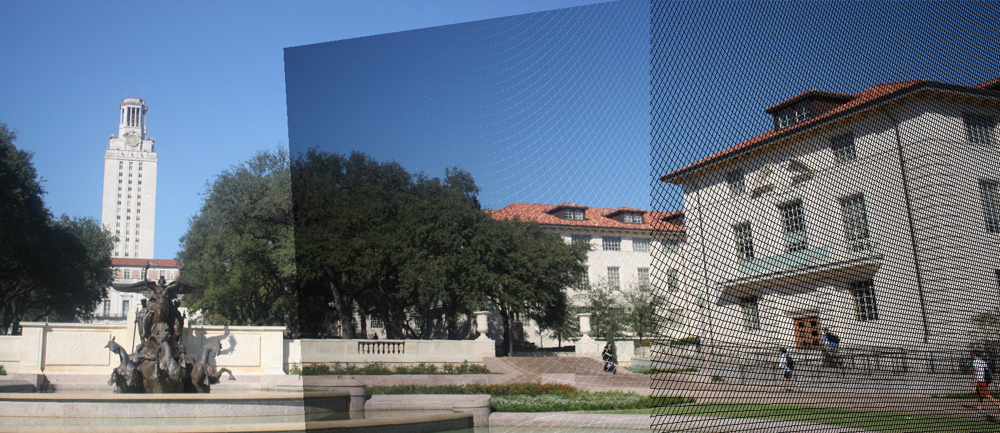

In [93]:
img1_kp, img1_descriptor = sift_descriptor(blank_frame)
img2_kp, img2_descriptor = sift_descriptor(img2)

matches = BF_FeatureMatcher(img2_descriptor,img1_descriptor,0.7)

H = compute_homography(img2_kp,img1_kp,matches)
p_dash = points_projection(img2, H)
new_frame = intensity_projection(img2,blank_frame,p_dash)
cv2_imshow(new_frame)

In [94]:
h_inv = np.linalg.inv(H)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  import sys


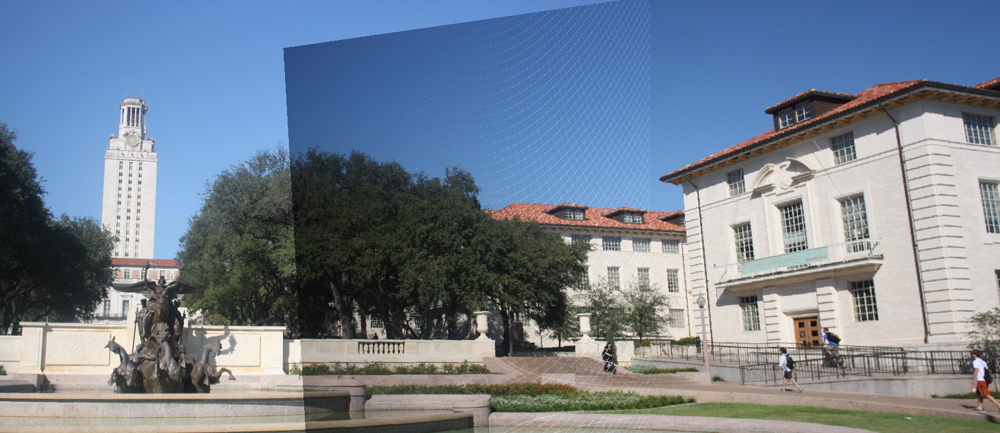

In [95]:
for i in range(500,new_frame.shape[1]):
  for j in range(new_frame.shape[0]):
    if (new_frame[j,i] == np.array([0,0,0])).all():
      p_dash = np.array([[i],[j],[1]])
      p = np.dot(h_inv,p_dash)
      p = (p/p[2])
      new_frame[j,i] = bilinear_interpolation(img2,p[0:2])
# cv2_imshow(new_frame)

# for i in range(img1.shape[0]):
#   for j in range(img1.shape[1]):
#     #  if (new_frame[i,j] == np.array([0,0,0])).all():
#     new_frame[i][j] = img1[i,j] 
#     #  else:
#     #    new_frame[i][j] = np.mean([img1[i,j] , new_frame[i][j]], axis=0)

cv2_imshow(new_frame)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  if __name__ == '__main__':


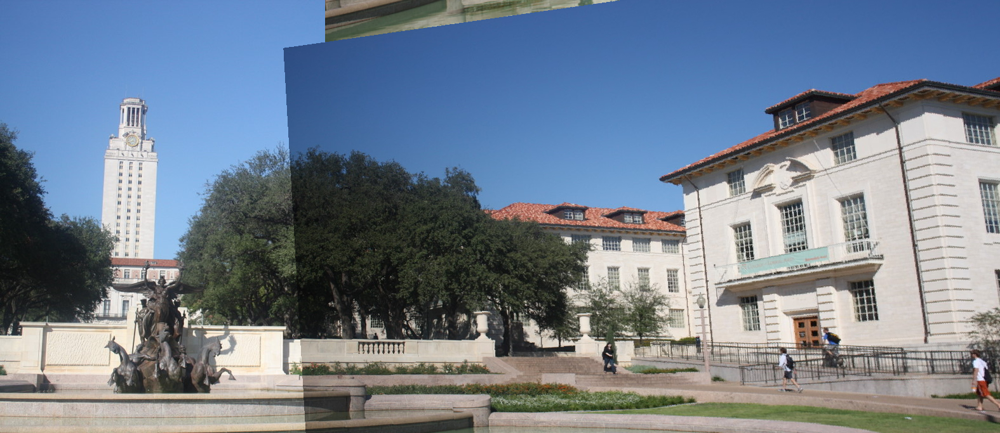

In [96]:
for i in range(int(img1.shape[1]/2),img1.shape[1]):
  for j in range(img1.shape[0]):
    if(new_frame[j,i] == img1[j,i]).all():
          # print([new_frame[i,j]])
          p_dash = np.array([[i],[j],[1]])
          p = np.dot(h_inv,p_dash)
          p = (p/p[2])
          # new_frame[j,i] = img2[int(p[1]),int(p[0])]
          new_frame[j,i] = bilinear_interpolation(img2,p[0:2])
          # recon = intensity_projection(img1,new_frame,p)
cv2_imshow(new_frame)

# 2.2 Warping Between Image Planes

Your Panorama is ready!!!


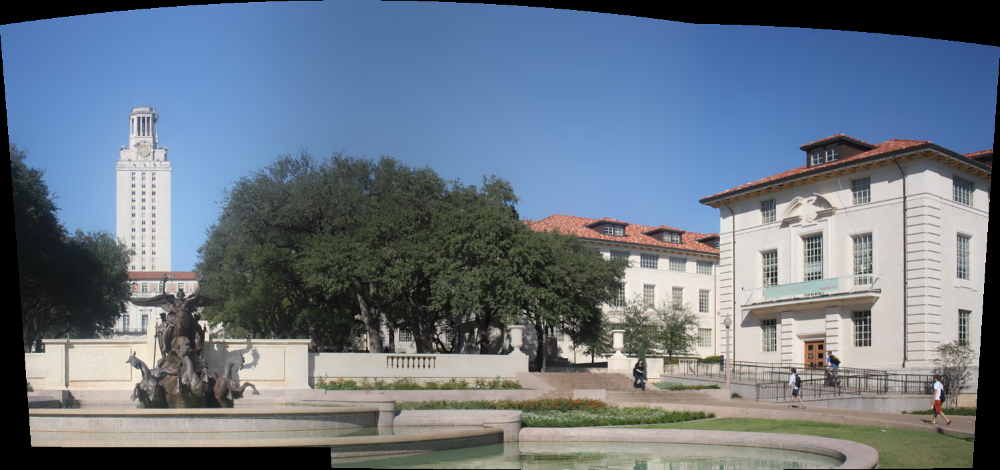

-1

In [32]:
stitchy=cv2.Stitcher.create()
(dummy,output)=stitchy.stitch([img1,img2])
 
if dummy != cv2.STITCHER_OK:
  # checking if the stitching procedure is successful
  # .stitch() function returns a true value if stitching is
  # done successfully
    print("stitching ain't successful")
else:
    print('Your Panorama is ready!!!')
 
# final output
cv2_imshow(output)
 
cv2.waitKey(0)

# Bonus

In [33]:
img2 = cv2.imread('/content/shanghai-21.png')
img1 = cv2.imread('/content/shanghai-22.png')
img3 = cv2.imread('/content/shanghai-23.png')

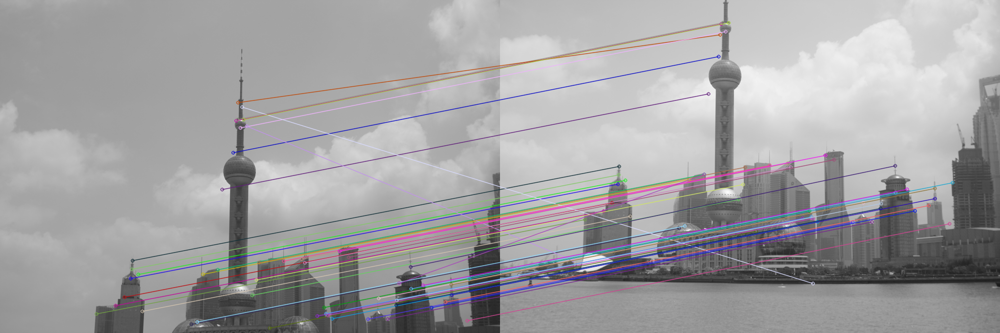

In [34]:
img1_kp, img1_descriptor = sift_descriptor(img1)
img2_kp, img2_descriptor = sift_descriptor(img2)
img3_kp, img3_descriptor = sift_descriptor(img3)

matches12 = BF_FeatureMatcher(img1_descriptor,img2_descriptor,0.7)
drawMatches(img1,img1_kp,img2,img2_kp,matches12[0:250:5])
H = compute_homography(img1_kp,img2_kp,matches12)

In [35]:
height = 1000
width = 2000
channels = 3
blank_frame = np.zeros((height,width,channels), dtype=np.uint8)
blank_frame = np.array(blank_frame)

blank_frame_cpy = np.copy(blank_frame)

for i in range(img1.shape[0]):
  for j in range(img1.shape[1]):
    blank_frame[i][j] = img1[i,j]
blank_frame = np.array(blank_frame)

In [36]:
img1_kp, img1_descriptor = sift_descriptor(blank_frame)
img2_kp, img2_descriptor = sift_descriptor(img2)

matches12 = BF_FeatureMatcher(img2_descriptor,img1_descriptor,0.7)

H = compute_homography(img2_kp,img1_kp,matches12)
p_dash = points_projection(img2, H)
new_frame = intensity_projection(img2,np.copy(blank_frame_cpy),p_dash)

In [37]:
h_inv = np.linalg.inv(H)
for i in range(0,1100):
  for j in range(200,900):
    if (new_frame[j,i] == np.array([0,0,0])).all():
      p_dash = np.array([[i],[j],[1]])
      p = np.dot(h_inv,p_dash)
      p = (p/p[2])
      new_frame[j,i] = bilinear_interpolation(img2,p[0:2])

for i in range(img1.shape[0]):
  for j in range(img1.shape[1]):
    new_frame[i][j] = img1[i,j]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  


In [38]:
new_frame_cropped = new_frame[0:900,0:1024]

In [39]:
img1_kp, img1_descriptor = sift_descriptor(new_frame)
img2_kp, img2_descriptor = sift_descriptor(img3)

matches3 = BF_FeatureMatcher(img2_descriptor,img1_descriptor,0.7)

H = compute_homography(img2_kp,img1_kp,matches3)
p_dash = points_projection(img3, H)
new_frame_1 = intensity_projection(img3,np.copy(blank_frame_cpy),p_dash)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  


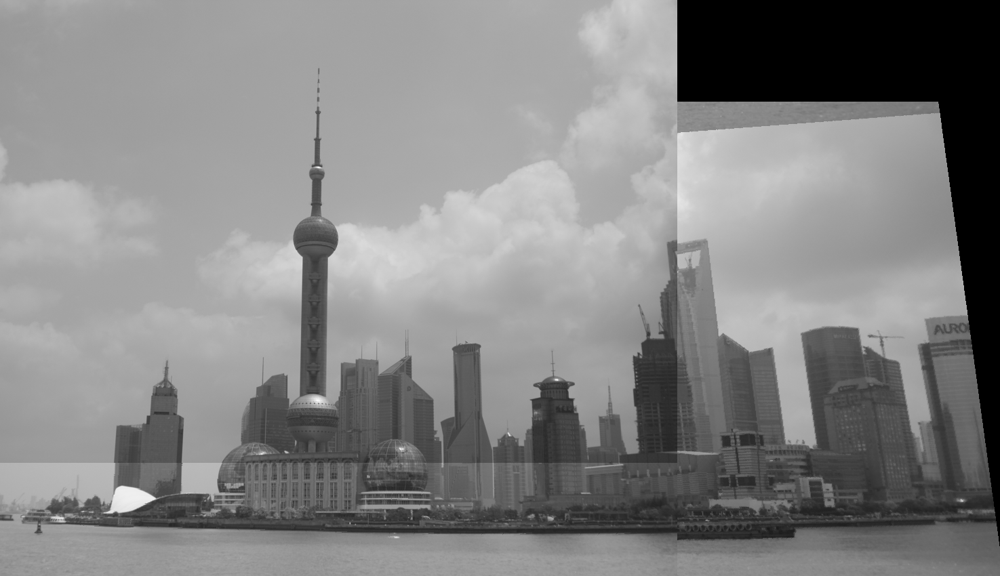

In [40]:
h_inv = np.linalg.inv(H)
for i in range(300,1550):
  for j in range(150,1000):
    if (new_frame_1[j,i] == np.array([0,0,0])).all():
      p_dash = np.array([[i],[j],[1]])
      p = np.dot(h_inv,p_dash)
      p = (p/p[2])
      new_frame_1[j,i] = bilinear_interpolation(img3,p[0:2])

for i in range(new_frame_cropped.shape[0]):
  for j in range(new_frame_cropped.shape[1]):
    new_frame_1[i][j] = new_frame_cropped[i,j]

new_frame_1_cropped = new_frame_1[0:850,25:1500]
cv2_imshow(new_frame_1_cropped)